In [180]:
import numpy as np
import pandas as pd
import plotly.express as px
import os
from glob2 import glob

In [194]:
df_path = "/media/nick/hdd02/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/pecfin_dynamics/point_cloud_data/fin_segmentation_tissue_only_best_model_tissue/"
df_list = sorted(glob(df_path + "*well*"))
print(df_list[-1])

/media/nick/hdd02/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/pecfin_dynamics/point_cloud_data/fin_segmentation_tissue_only_best_model_tissue/20240712_02_well0021_time0000_labels.csv


#### Inspect a segmentated dataset and experiment with surface fitting etc

(7428, 19)
(7428, 19)
(5541, 19)


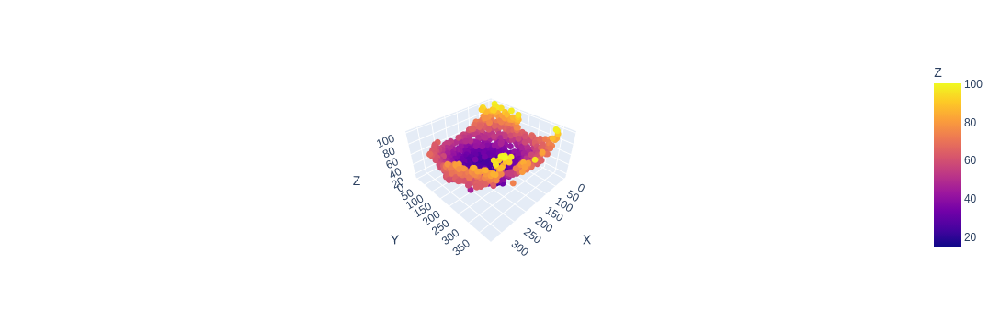

In [195]:
df_path = df_list[-1]
df = pd.read_csv(df_path)
print(df.shape)
# df["Z"] = -df["Z"]
size_thresh = 150
print(df.shape)
df = df.loc[df["size"]>=size_thresh, :]
print(df.shape)

fig = px.scatter_3d(df.loc[df["fin_label_final"]==2], x="X", y="Y", z="Z",  color="Z",  opacity=1)
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()

### Calculate distance from each yolk point to fin

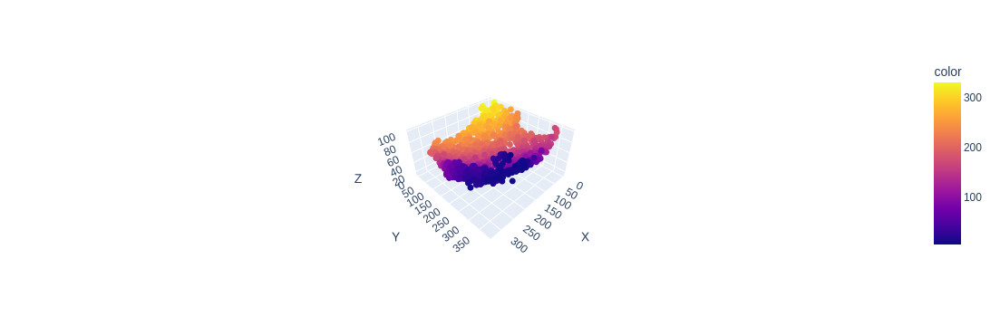

In [196]:
from scipy.spatial import distance_matrix

yolk_data = df.loc[df["fin_label_final"]==2, ["X", "Y", "Z"]].to_numpy()
fin_data = df.loc[df["fin_label_final"]==1, ["X", "Y", "Z"]].to_numpy()
dist_mat = distance_matrix(yolk_data, fin_data)
yolk_to_fin_dist = np.min(dist_mat, axis=1)

fig = px.scatter_3d(df.loc[df["fin_label_final"]==2], x="X", y="Y", z="Z",  color=yolk_to_fin_dist,  opacity=1)
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()

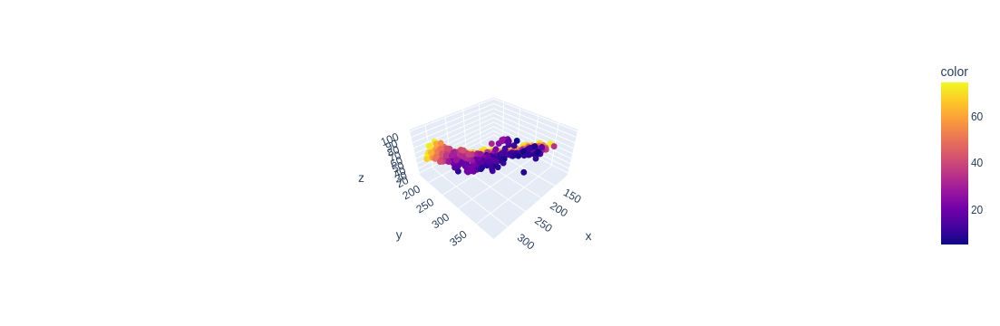

In [197]:
dist_thresh = 75 # in um
dist_ft = yolk_to_fin_dist <= dist_thresh

fig = px.scatter_3d(x=yolk_data[dist_ft, 0], y=yolk_data[dist_ft, 1], z=yolk_data[dist_ft, 2],  color=yolk_to_fin_dist[dist_ft],  opacity=1)
fig.update_traces(marker_size = 4)
scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()

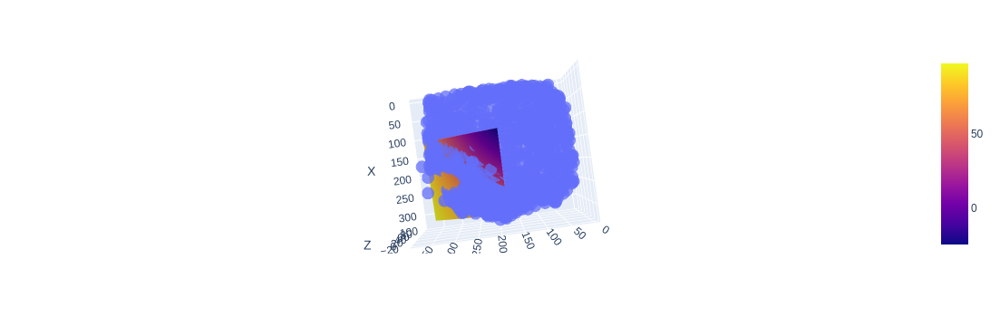

In [198]:
import scipy 
import plotly.graph_objects as go

data = yolk_data[dist_ft] #df.loc[df["fin_label_final"]==2, ["X", "Y", "Z"]].to_numpy()

# best-fit quadratic curve
test_y = np.arange(np.percentile(data[:,1], 0.5), np.percentile(data[:,1], 99.5), 1)
test_x = np.arange(np.percentile(data[:,0], 0.5), np.percentile(data[:,0], 99.5), 1)
XX, YY = np.meshgrid(test_x, test_y)
X = XX.ravel()
Y = YY.ravel()


A = np.c_[np.ones(data.shape[0]), data[:,:2], np.prod(data[:,:2], axis=1), data[:,:2]**2]
C_yolk,_,_,_ = scipy.linalg.lstsq(A, data[:,2])

# evaluate it on a grid
Z = np.dot(np.c_[np.ones(X.shape), X, Y, X*Y, X**2, Y**2], C_yolk).reshape(X.shape)

fig = px.scatter_3d(df.loc[df["fin_label_final"]==2], x="X", y="Y", z="Z",   opacity=0.75)
fig.add_trace(go.Surface(x=XX, y=YY, z=np.reshape(Z, XX.shape)))
fig.show()

### Now let's use it to clean up the base of the pec fin
Keep only points that are above the fin surface in Z. This should always be the case

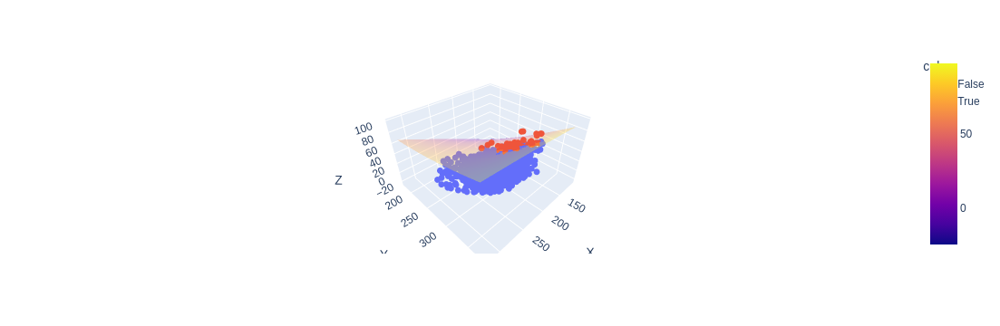

In [199]:
surf_xyz = np.c_[X, Y, Z]
data_fin = df.loc[df["fin_label_final"]==1, ["X", "Y", "Z"]].to_numpy()
data_fin0 = data_fin.copy()
# find closest points
dist_mat_fin = distance_matrix(data_fin, surf_xyz)
min_d_fin = np.min(dist_mat_fin, axis=1)
min_i_fin = np.argmin(dist_mat_fin, axis=1)

# flag points in fin that are "inside" the yolk surface
surf_flags = (data_fin[:, 2] > surf_xyz[min_i_fin, 2]) | (min_d_fin <= 1)

fig = px.scatter_3d(df.loc[df["fin_label_final"]==1], x="X", y="Y", z="Z",  color=surf_flags, opacity=1)
fig.update_traces(marker_size = 4)
fig.add_trace(go.Surface(x=XX, y=YY, z=np.reshape(Z, XX.shape), opacity=0.3))
fig.show()

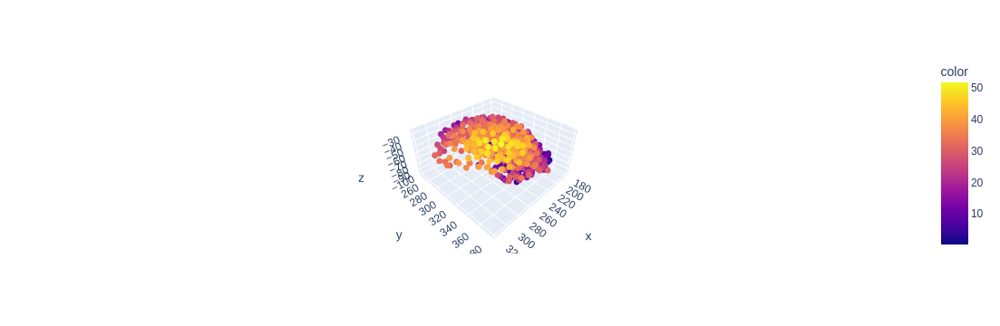

In [200]:
fig = px.scatter_3d(x=data_fin[:,0], y=data_fin[:,1], z=-data_fin[:,2],  color=min_d_fin,  opacity=1)
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()

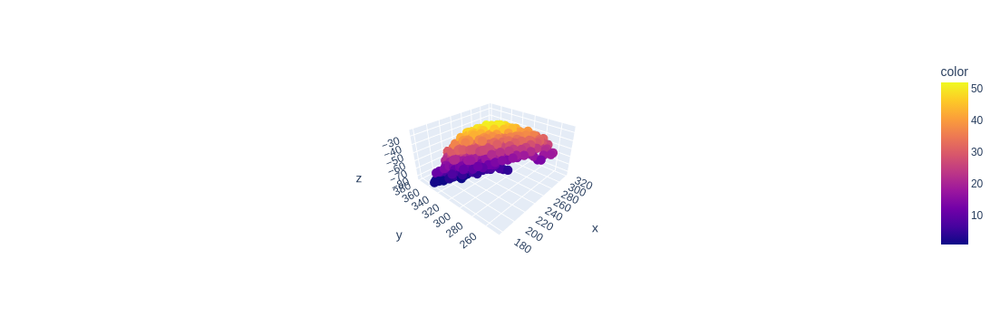

In [201]:
fig = px.scatter_3d(x=data_fin[~surf_flags,0], y=data_fin[~surf_flags,1], z=-data_fin[~surf_flags,2],  color=min_d_fin[~surf_flags],  opacity=1)
fig.update_traces(marker_size = 6)

scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()

### Experiment with NN-based outlier removal to clean up fin

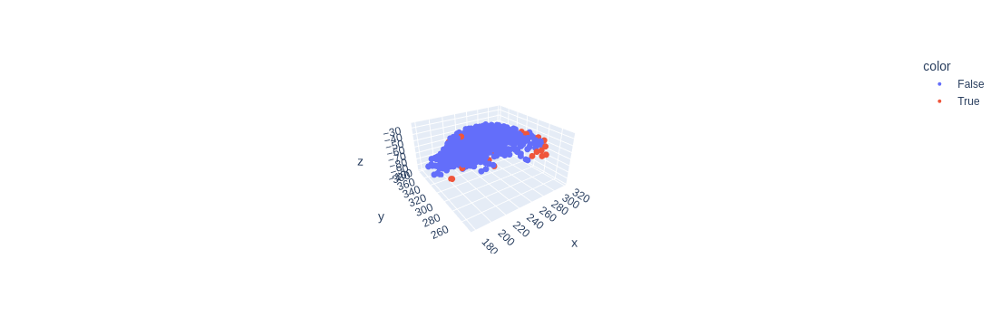

In [202]:
from sklearn.neighbors import KDTree

# data_fin = data_fin[~surf_flags]
k_nn = 3
tree = KDTree(data_fin)
nearest_dist, nearest_ind = tree.query(data_fin, k=k_nn + 1)

nn_mean = np.mean(nearest_dist, axis=0)
nn_scale = nn_mean[1]
far_flags = nearest_dist[:, k_nn] > 2*nn_scale

fig = px.scatter_3d(x=data_fin[:,0], y=data_fin[:,1], z=-data_fin[:,2],  color=far_flags,  opacity=1)
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=0.5)
           )
fig.update_layout(scene=scene)

fig.show()


### Can we fit a surface to the fin?

That didn't quite seem to do the job...why not? Previously, I solve this problem by forcing the surface to pass through a point at the base/center of the fin. One could imagine further requiring it pass through one or multiple points at the tip of the fin. This seems convoluted, though

In [203]:
def calculate_path_distance(FDECAB, p0, p1):
    dx = p0[0] - p1[0]
    dy = p0[1] - p1[1]

    I = quad(numerical_integral, 0, 1, args=(FDECAB, p0, [dx, dy]))

    return I[1] - I[0]

def solve_for_f(C_fit, cp):
    # C0 = z0 - C1*x0 - C2*y0 - C3*x0*yz - C4*x0**2 - C5*Y0**2
    x0 = cp[0]
    y0 = cp[1]
    z0 = cp[2]
    C0 = z0 - C_fit[0] * x0 - C_fit[1] * y0 - C_fit[2] * x0 * y0 - C_fit[3] * x0 ** 2 - C_fit[4] * y0 ** 2
    C_out = [C0, C_fit[0], C_fit[1], C_fit[2], C_fit[3], C_fit[4]]
    return C_out

def predict_quadratic_surface(xy, DECAB, point):
    C_full = solve_for_f(DECAB, point)
    A = np.c_[np.ones(xy.shape[0]), xy, np.prod(xy, axis=1), xy**2]
    surf_pd = np.dot(A, C_full).ravel()
    xyz_out = np.concatenate((xy, np.reshape(surf_pd, (xy.shape[0], 1))), axis=1)

    return xyz_out, C_full
    
def numerical_integral(t, FDECAB, P0, V):
    F, D, E, C, A, B = FDECAB
    v0, v1 = V
    x0, y0, _ = P0
    integrand = np.sqrt(v0**2 + v1**2 + (D*v0 + 2*A*v0*(t*v0 + x0) + v1*(E + 2*C*t*v0 + 2*B*t*v1 + C*x0) + (C*v0 + 2*B*v1)*y0)**2)

    return integrand

def calculate_tangent_plane(C_full, point):
    F, D, E, C, A, B = C_full
    dfdx = 2 * A * point[0] + C * point[1] + D
    dfdy = 2 * B * point[1] + C * point[0] + E
    dfdz = -1
    plane_vec_norm = np.asarray([dfdx, dfdy, dfdz])
    plane_vec_norm = plane_vec_norm / np.sqrt(np.sum(plane_vec_norm ** 2))
    
    # calculate D
    D = -np.dot(plane_vec_norm, point)

    return (plane_vec_norm, D)

In [253]:
from sklearn.decomposition import PCA
import open3d as o3d
from sklearn.cluster import KMeans
from scipy.integrate import quad

# pec_fin_nuclei = np.where(df["fin_label_final"]==1)[0]
# c0 = np.asarray([125, 370, -130])
# r=100


# test = fit_quadratic_surface(df, c0, pec_fin_nuclei, r, k_nn=7)


# def fit_quadratic_surface(df, C_yolk, pec_fin_nuclei, r, k_nn=7):
"""

:param df: Pandas dataframe contining xyz coordinates of all nuclei
:param c0: 1x3 vector containing coordinates of sphere center
:param pec_fin_nuclei: Integer vector containing indices of all nuclei that are part of the pec fin
:param r: [float] radius of the sphere
:param k_nn: [int] designates which neighbor in the NN graph to use to set the length scale for axis fitting
:return:
"""

# fit corresponding plane
# get nn distances
xyz_array = df[["X", "Y", "Z"]].to_numpy()
tree = KDTree(xyz_array)
nearest_dist, nearest_ind = tree.query(xyz_array, k=k_nn + 1)

# find average distance to kth closest neighbor
mean_nn_dist_vec = np.mean(nearest_dist, axis=0)
nn_thresh = mean_nn_dist_vec[k_nn]
nn_thresh_small = mean_nn_dist_vec[1]

# find pec fin nuclei that are near the sphere surface
xyz_fin = data_fin #[~far_flags]#df[["X", "Y", "Z"]].iloc[pec_fin_nuclei].to_numpy()
dist_array = np.min(distance_matrix(xyz_fin, surf_xyz), axis=1)
surf_indices = np.where(dist_array <= nn_thresh)[0]
xyz_surf = xyz_fin[surf_indices]

# calculate centroid
surf_cm = np.mean(xyz_surf, axis=0)
closest_i = np.argmin(np.sqrt(np.sum((surf_cm - surf_xyz)**2, axis=1)))
closest_point = surf_xyz[closest_i]

# calculate PCA
pca_surf = PCA(n_components=3)

pca_surf.fit(xyz_surf)
vec1 = pca_surf.components_[0]
# vec2 = surf_cm - c0

vec2, D = calculate_tangent_plane(C_yolk, closest_point)
vec2 = vec2 / np.sqrt(np.sum(vec2 ** 2))

if vec2[2] > 0:
    vec2 = -vec2

In [254]:
plane_normal = np.cross(vec1, vec2)
plane_normal_u = plane_normal / np.sqrt(np.sum(plane_normal ** 2))
D_plane = -np.dot(plane_normal, surf_cm)

# generate additional points to constrain the axis fit such that it is approximately normal to the sphere when
# it intersects the sphere surface
# In future, we could consider adding a constraint directly to the objective function that enforces this

lower_point = surf_cm - vec2 * nn_thresh_small
n_reps = int(0.05*xyz_fin.shape[0])
add_array = np.empty((4*n_reps, 3))
add_array[:n_reps, :] = lower_point
add_array[n_reps:2*n_reps, :] = lower_point - nn_thresh * vec2
add_array[2*n_reps:3*n_reps, :] = lower_point - 2*nn_thresh * vec2
add_array[3*n_reps:4*n_reps, :] = lower_point - 3*nn_thresh * vec2

#######################
# fit surface to fin points
#######################
# xyz_fin_raw = df[["X", "Y", "Z"]].iloc[pec_fin_nuclei]
xyz_fin_raw = xyz_fin.copy()
xyz_surf = xyz_fin[surf_indices]

# exclude base points that are too far from our plane prior. If included, these will tend to cause the
# surface fit to perform poorly
d_surf = np.abs(np.sum(np.multiply(plane_normal_u, xyz_surf), axis=1) + D_plane)
ind_rm = surf_indices[np.where(d_surf > nn_thresh)[0]]
keep_indices = [k for k in range(xyz_fin_raw.shape[0]) if k not in ind_rm]
xyz_fin = xyz_fin_raw[keep_indices].copy()

# convert to point cloud and downsample points
tree = KDTree(xyz_fin)
nearest_dist, nearest_ind = tree.query(xyz_fin, k=2)

# find average distance to kth closest neighbor
mean_nn_dist_vec = np.mean(nearest_dist, axis=0)
nn_thresh1 = mean_nn_dist_vec[1]  # sets scale for downsampling withing the fin

# downsample to achieve uniform distribution of fit points
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(xyz_fin)
pcd_down = pcd.voxel_down_sample(voxel_size=nn_thresh1 * 1.5)
xyz_fin_down = np.asarray(pcd_down.points)

# Transform to PCA space
PCAFIN = PCA(n_components=3)
PCAFIN.fit(xyz_fin_down)
pca_fin_full = PCAFIN.transform(xyz_fin_raw)
pca_fin_raw = PCAFIN.transform(xyz_fin_down)
pca_fin_add_array = PCAFIN.transform(add_array)
pca_fin_surf = PCAFIN.transform(xyz_surf)

# use kmeans to find key points. Note that we cluster only in PCA0-PCA1 space
n_clusters = 100
kmeans = KMeans(n_clusters=n_clusters).fit(pca_fin_raw[:, 0:2])
k_labels = kmeans.labels_
pca_fin_array = np.empty((n_clusters, 3))
for n in range(n_clusters):
    k_indices = np.where(k_labels == n)[0]
    pca_fin_array[n, :] = np.mean(pca_fin_raw[k_indices, :], axis=0)

pca_fin_array = np.concatenate((pca_fin_array, pca_fin_add_array), axis=0)

# Transform fin base and sphere center points to PCA space
pca_fin_surf_cm = PCAFIN.transform(np.reshape(surf_cm, (1, 3)))
pca_fin_surf_cm = pca_fin_surf_cm.ravel()
# pca_c0 = PCAFIN.transform(np.reshape(c0, (1, 3)))
# pca_c0 = pca_c0.ravel()

# generate reference grid for use during the fit procedure
grid_res = 50
P0, P1 = np.meshgrid(np.linspace(np.min(pca_fin_raw[:, 0]), np.max(pca_fin_raw[:, 0]), grid_res),
                     np.linspace(np.min(pca_fin_raw[:, 1]), np.max(pca_fin_raw[:, 1]), grid_res))

PP0 = P0.flatten()
PP1 = P1.flatten()

xy2 = np.concatenate((PP0[:, np.newaxis], PP1[:, np.newaxis]), axis=1)

def l2_fit_loss_point_euc(C_prop, xyz_fin=pca_fin_array, xy=xy2, cp=pca_fin_surf_cm):
    xyz_pd, C0_full = predict_quadratic_surface(xy, C_prop, cp)
    dist_array = distance_matrix(xyz_fin, xyz_pd)
    residuals = np.min(dist_array, axis=1)
    return residuals

def l2_fit_loss_point_split(C_prop, xyz_fin=pca_fin_array, xy=xy2, cp=pca_fin_surf_cm):
    xyz_pd, C0_full = predict_quadratic_surface(xy, C_prop, cp)
    dist_array = distance_matrix(xyz_fin, xyz_pd)
    
    residuals = np.min(dist_array, axis=1)**3
    nn_i = np.argmin(dist_array, axis=1)
    signs = np.sign(xyz_fin[:, 2] - xyz_pd[nn_i, 2])
    err = np.sum(np.multiply(residuals,signs))
    return err + residuals

# NL: this version directly enforces that the surface be normal to the sphere where it intersects the surface
# I found that this lead to poor fit quality, but worth further exploration
# def l2_fit_loss_plane_euc(C_prop, xyz_fin=pca_fin, xy=xy2, cp=pca_fin_surf_cm, sp=pca_c0):
#     xyz_pd, C0_full, _, _ = predict_quadratic_surface2(xy, C_prop, cp, sp)
#     dist_array = distance_matrix(xyz_fin, xyz_pd)
#     residuals = np.min(dist_array, axis=1)
#     return residuals

# initial guess
c0 = [-3, 0.01, 0.015, 0.001, 0.005, 0.01]

# Conduct the fit
c_fit = scipy.optimize.least_squares(l2_fit_loss_point_euc, c0[1:])
C_fit = c_fit.x
C_out = solve_for_f(C_fit, pca_fin_surf_cm)
P2_curve = np.dot(np.c_[np.ones(PP0.shape), PP0, PP1, PP0 * PP1, PP0 ** 2, PP1 ** 2], C_out).reshape(P0.shape)

xyz_fit_curve = PCAFIN.inverse_transform(np.concatenate((np.reshape(P0, (P0.size, 1)),
                                                         np.reshape(P1, (P1.size, 1)),
                                                         np.reshape(P2_curve, (P2_curve.size, 1))),
                                                        axis=1)
                                         )

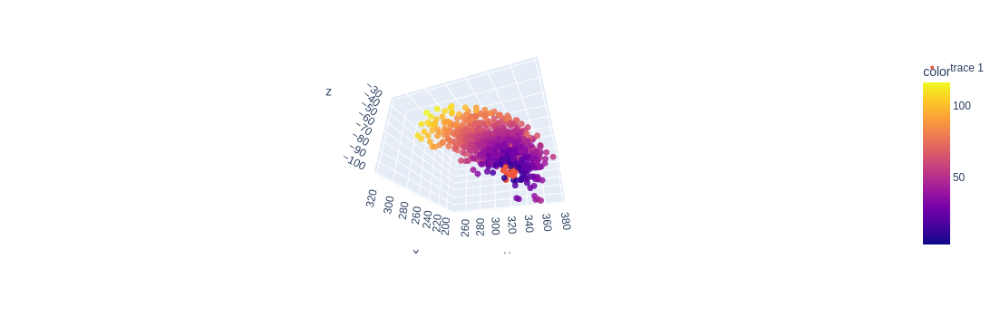

In [275]:
# fig = px.scatter_3d(x=pca_fin_array[:, 0], y=pca_fin_array[:, 1], z=pca_fin_array[:, 2], opacity=0.85)
# fig.show()

nearest_dist, nearest_ind = tree.query(surf_cm[np.newaxis, :], k=xyz_fin.shape[0])
far_id = nearest_ind[:, :10][0]

fig = px.scatter_3d(x=xyz_fin[:, 0], y=xyz_fin[:, 1], z=-xyz_fin[:, 2], color = nearest_dist[:, np.argsort(nearest_ind)].ravel(), opacity=0.85)
fig.add_trace(go.Scatter3d(x=xyz_fin[far_id, 0], y=xyz_fin[far_id, 1], z=-xyz_fin[far_id, 2], mode="markers"))
fig.update_traces(marker_size = 4)

fig.show()


In [271]:
nearest_ind[:, -1][0]

184

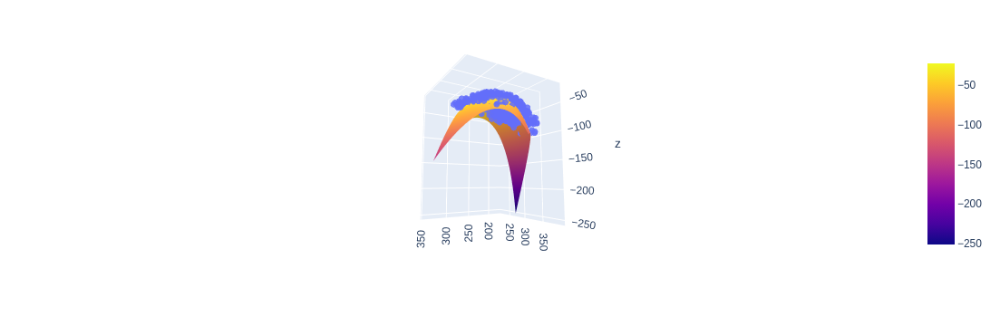

In [256]:
# xyz_curve = test[0] 

fig = px.scatter_3d(x=data_fin[:, 0], y=data_fin[:, 1], z=-data_fin[:, 2], opacity=0.85)
fig.update_traces(marker_size = 4)

fig.add_trace(go.Surface(x=np.reshape(xyz_fit_curve[:, 0], (50, 50)), 
                         y=np.reshape(xyz_fit_curve[:, 1], (50, 50)), 
                         z=-np.reshape(xyz_fit_curve[:, 2], (50, 50))))
fig.show()

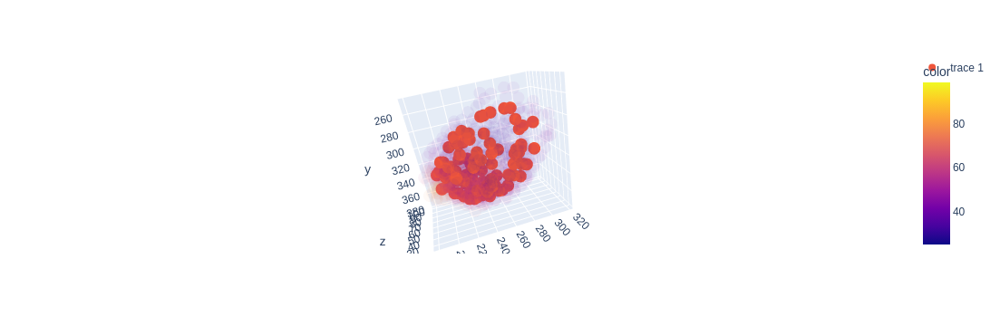

In [209]:
from skimage.measure import block_reduce

data_set = data_fin0#[~far_flags]

n_sample_points = 100
n_neighbors = 25

tree = KDTree(data_set)
nearest_dist, nearest_ind = tree.query(data_set, k=n_neighbors)

options = np.arange(0, data_set.shape[0])
sample_points = np.random.choice(options, n_sample_points, replace=True)
nearest_ind_array = nearest_ind[sample_points, :].ravel()

xyz_long = data_set[nearest_ind_array, :]
# xyz_deep = np.reshape(xyz_long, (n_sample_points, 3, n_neighbors))
points = block_reduce(xyz_long, (n_neighbors, 1), func=np.mean) #np.mean(xyz_deep, axis=2)


fig = px.scatter_3d(x=data_set[:, 0], y=data_set[:, 1], z=data_set[:, 2], color=data_set[:, 2], opacity=0.05)
fig.add_trace(go.Scatter3d(x=points[:,0], y=points[:,1], z=points[:,2], mode="markers"))
fig.show()

In [132]:
import open3d as o3d

(100, 3)

## Try to fit a plynomial surface to the yolk points

In [35]:
def polyfit2d(x, y, z, kx=3, ky=3, order=None):
    '''
    Two dimensional polynomial fitting by least squares.
    Fits the functional form f(x,y) = z.

    Notes
    -----
    Resultant fit can be plotted with:
    np.polynomial.polynomial.polygrid2d(x, y, soln.reshape((kx+1, ky+1)))

    Parameters
    ----------
    x, y: array-like, 1d
        x and y coordinates.
    z: np.ndarray, 2d
        Surface to fit.
    kx, ky: int, default is 3
        Polynomial order in x and y, respectively.
    order: int or None, default is None
        If None, all coefficients up to maxiumum kx, ky, ie. up to and including x^kx*y^ky, are considered.
        If int, coefficients up to a maximum of kx+ky <= order are considered.

    Returns
    -------
    Return paramters from np.linalg.lstsq.

    soln: np.ndarray
        Array of polynomial coefficients.
    residuals: np.ndarray
    rank: int
    s: np.ndarray

    '''

    # grid coords
    # x, y = np.meshgrid(x, y)
    # coefficient array, up to x^kx, y^ky
    coeffs = np.ones((kx+1, ky+1))

    # solve array
    a = np.zeros((coeffs.size, x.size))

    # for each coefficient produce array x^i, y^j
    for index, (j, i) in enumerate(np.ndindex(coeffs.shape)):
        # do not include powers greater than order
        if order is not None and i + j > order:
            arr = np.zeros_like(x)
        else:
            arr = coeffs[i, j] * x**i * y**j
        a[index] = arr.ravel()

    print(a.shape)
    print(z.shape)
    # do leastsq fitting and return leastsq result
    return np.linalg.lstsq(a.T, np.ravel(z), rcond=None)

In [51]:
x = df.loc[df["fin_label_final"]=="2", "X"].to_numpy()
y = df.loc[df["fin_label_final"]=="2", "Y"].to_numpy()
z = df.loc[df["fin_label_final"]=="2", "Z"].to_numpy()

print(x.shape)
order = 5
zs = polyfit2d(x, y, z[:, np.newaxis], kx=order, ky=order, order=None)



(1639,)
(36, 1639)
(1639, 1)


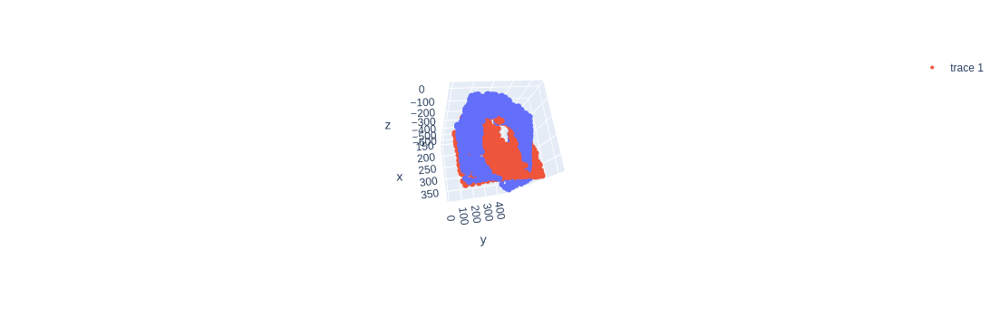

In [52]:
import plotly.graph_objects as go
fitted_surf = np.polynomial.polynomial.polyval2d(x, y, zs[0].reshape((order+1,order+1)))

fig = px.scatter_3d(x=x, y=y, z=fitted_surf, opacity=1)
fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode="markers"))
fig.update_traces(marker_size = 4)

scene=dict(
           aspectratio=dict(x=1, y=1, z=700/350)
           )
fig.update_layout(scene=scene)

fig.show()